# #30DayMapChallenge - Día 7: Vintage
## Caso de Negocio: Leer el pasado para entender el suelo del presente

**Autor:** Mario Ignacio Ibañez Castro | **Rol:** Data Scientist & Strategic Planner

### El objetivo
Georreferenciar un grabado de **1524** no se resuelve con un simple affine (trasladar/rotar un rectángulo). El mapa es esquemático: hay que **deformarlo** con varios GCPs (*rubber-sheet* / Thin Plate Spline) para que cada punto caiga en su lon/lat real —aunque el grabado pierda proporciones.

**Pregunta de negocio:** ¿Dónde cae Tenochtitlan sobre el tejido urbano/satelital actual?

**Reto técnico:** Georreferenciación multipunto (TPS) de cartografía antigua.

**Fuente:** Grabado de Núremberg 1524 (Wikimedia, dominio público). Referencia institucional: Mapoteca Manuel Orozco y Berra.

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import contextily as ctx
from pathlib import Path
from PIL import Image
import rasterio

plt.style.use('dark_background')
%matplotlib inline

RUTA_DATOS = Path('../00_Datos')
CARPETA_SALIDA = Path('.')
MAPA_CRUDO = RUTA_DATOS / 'mapa_vintage_tenochtitlan.png'
MAPA_TPS_PREVIEW = RUTA_DATOS / 'mapa_vintage_tps_preview.png'
GCPS_CSV = RUTA_DATOS / 'gcps_vintage.csv'
GEOTIFF_3857 = RUTA_DATOS / 'tenochtitlan_1524_tps_3857.tif'

# Opacidad 75% del grabado sobre satélite
ALPHA_VINTAGE = 0.75

### 1. El artefacto vintage (sin georreferenciar)
Imagen orientada Norte-arriba. Todavía son solo píxeles.

Tamaño crudo: 1224 x 999 px


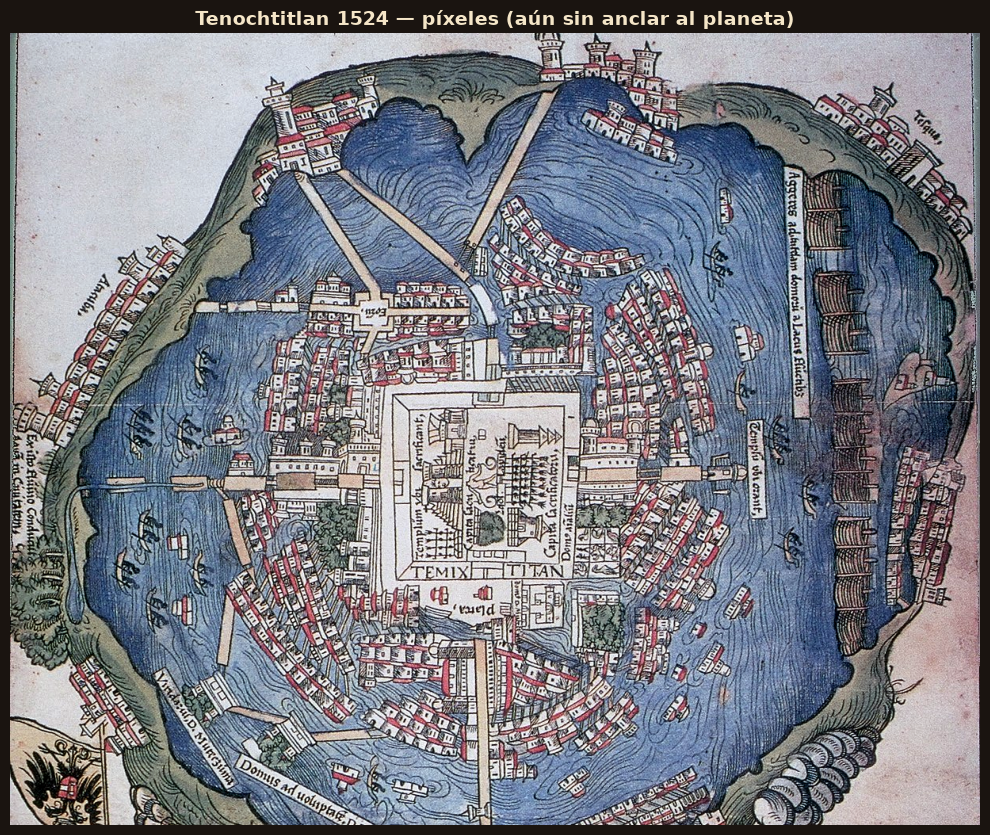

In [2]:
img = Image.open(MAPA_CRUDO)
print(f'Tamaño crudo: {img.size[0]} x {img.size[1]} px')

fig, ax = plt.subplots(figsize=(10, 9))
fig.patch.set_facecolor('#1a1410')
ax.imshow(img)
ax.set_title('Tenochtitlan 1524 — píxeles (aún sin anclar al planeta)', fontsize=14, fontweight='bold', color='#F5E6C8')
ax.set_axis_off()
plt.tight_layout()
plt.savefig(CARPETA_SALIDA / 'Dia7_Mapa_Vintage_Crudo.png', dpi=150, facecolor=fig.get_facecolor(), bbox_inches='tight')
plt.show()

### 2. GCPs multipunto
12 puntos de control: Templo Mayor, calzadas (Tepeyac / Iztapalapa / Tacuba / Texcoco) y orillas del lago. Fuerzan el *rubber-sheet*.

,nombre,pixel_x,pixel_y,longitud,latitud
0,templo_mayor,612.0,479.5,-99.1317,19.4346
1,calzada_norte_tepeyac,612.0,179.8,-99.1310,19.4580
2,calzada_sur_iztapalapa,612.0,779.2,-99.1305,19.4120
3,calzada_oeste_tacuba,269.3,479.5,-99.1550,19.4335
4,calzada_este_texcoco,954.7,479.5,-99.1080,19.4350
5,orilla_NO,320.7,224.8,-99.1500,19.4520
6,orilla_NE,903.3,224.8,-99.1120,19.4520
7,orilla_SO,320.7,734.3,-99.1500,19.4180
8,orilla_SE,903.3,734.3,-99.1120,19.4180
9,plaza_mercado,538.6,499.5,-99.1365,19.4330


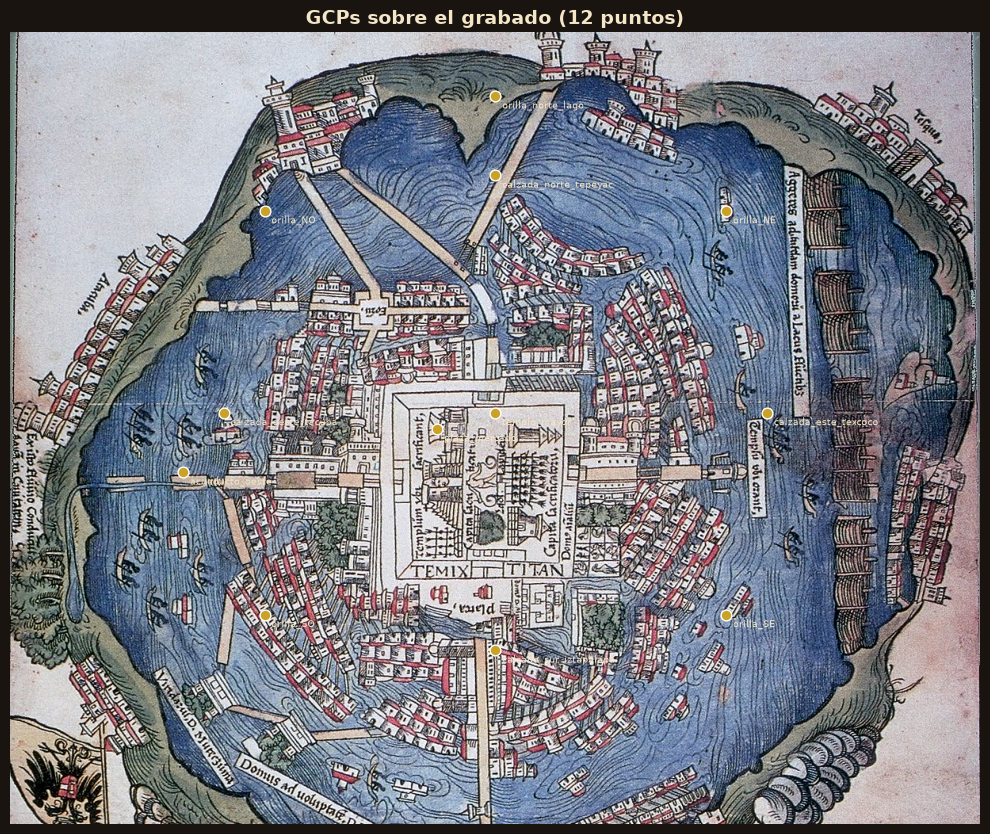

In [3]:
gcps_df = pd.read_csv(GCPS_CSV)
display(gcps_df)

fig, ax = plt.subplots(figsize=(10, 9))
fig.patch.set_facecolor('#1a1410')
ax.imshow(img)
ax.scatter(gcps_df['pixel_x'], gcps_df['pixel_y'], s=60, c='#C9A227', edgecolors='white', linewidths=1, zorder=3)
for _, r in gcps_df.iterrows():
    ax.annotate(r['nombre'], (r['pixel_x'], r['pixel_y']), textcoords='offset points', xytext=(5, -9), fontsize=6.5, color='#F5E6C8')
ax.set_title(f'GCPs sobre el grabado ({len(gcps_df)} puntos)', fontsize=14, fontweight='bold', color='#F5E6C8')
ax.set_axis_off()
plt.tight_layout()
plt.savefig(CARPETA_SALIDA / 'Dia7_GCPs.png', dpi=150, facecolor=fig.get_facecolor(), bbox_inches='tight')
plt.show()

### 3. Thin Plate Spline (TPS) — deformar para georreferenciar
Cada GCP del grabado se mapea a su lon/lat. El TPS **estira y comba** la imagen para cumplir todos los puntos a la vez.

```bash
python ../00_Datos/prepararMapaVintage.py
```

Ese script genera el GeoTIFF TPS ya anclado a EPSG:4326 / 3857.

Preview TPS: 1800 x 1600 px (canvas geográfico)


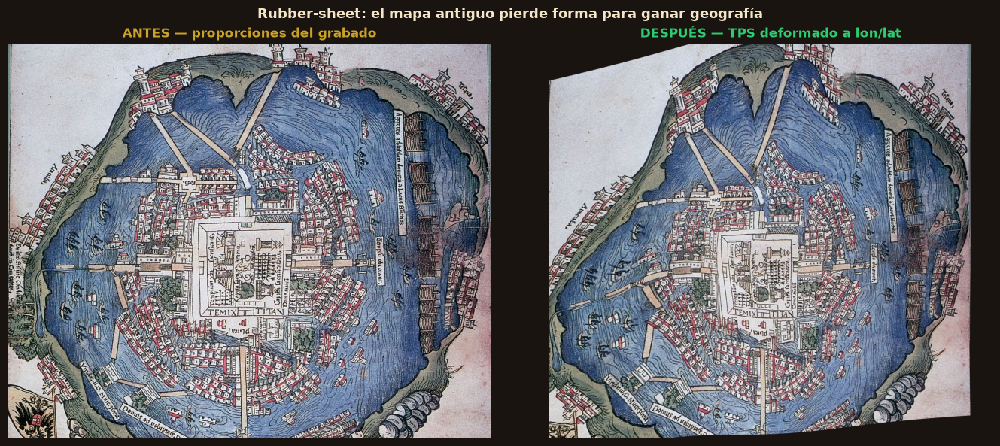

In [4]:
tps_preview = Image.open(MAPA_TPS_PREVIEW)
print(f'Preview TPS: {tps_preview.size[0]} x {tps_preview.size[1]} px (canvas geográfico)')

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.patch.set_facecolor('#1a1410')
axes[0].imshow(img)
axes[0].set_title('ANTES — proporciones del grabado', color='#C9A227', fontweight='bold')
axes[0].set_axis_off()
axes[1].imshow(tps_preview)
axes[1].set_title('DESPUÉS — TPS deformado a lon/lat', color='#2ECC71', fontweight='bold')
axes[1].set_axis_off()
fig.suptitle('Rubber-sheet: el mapa antiguo pierde forma para ganar geografía', color='#F5E6C8', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(CARPETA_SALIDA / 'Dia7_TPS_Deformacion.png', dpi=150, facecolor=fig.get_facecolor(), bbox_inches='tight')
plt.show()

### 4. Validar el GeoTIFF georreferenciado
Leemos bounds reales del raster TPS (ya no es un rectángulo "flotante" con affine flojo).

In [5]:
with rasterio.open(GEOTIFF_3857) as src:
    print(f'CRS: {src.crs}')
    print(f'Tamaño: {src.width} x {src.height}')
    print(f'Bounds (3857): {src.bounds}')
    rgba = np.transpose(src.read([1, 2, 3, 4]), (1, 2, 0))
    extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    # Máscara alpha: solo píxeles con contenido
    alpha = rgba[:, :, 3]
    print(f'Píxeles con tinta: {(alpha > 10).sum():,} / {alpha.size:,}')

# Templo Mayor (GCP principal)
tm = gcps_df[gcps_df['nombre'] == 'templo_mayor'].iloc[0]
lon_tm, lat_tm = float(tm.longitud), float(tm.latitud)
gdf_tm = gpd.GeoDataFrame(
    [{'nombre': 'Templo Mayor'}],
    geometry=gpd.points_from_xy([lon_tm], [lat_tm]),
    crs='EPSG:4326'
).to_crs(epsg=3857)
print(f'Templo Mayor ancla: {lat_tm:.5f}°N, {abs(lon_tm):.5f}°W')

CRS: EPSG:3857
Tamaño: 1752 x 1652
Bounds (3857): BoundingBox(left=-11040110.499422906, bottom=2201495.8347690767, right=-11030094.566096302, top=2210940.0824035225)
Píxeles con tinta: 2,655,701 / 2,894,304
Templo Mayor ancla: 19.43460°N, 99.13170°W


### 5. Mapa final: vintage TPS sobre satélite
Opacidad 75%. El grabado deformado debe coincidir con el Centro Histórico / vaso lacustre en la imagen satelital.

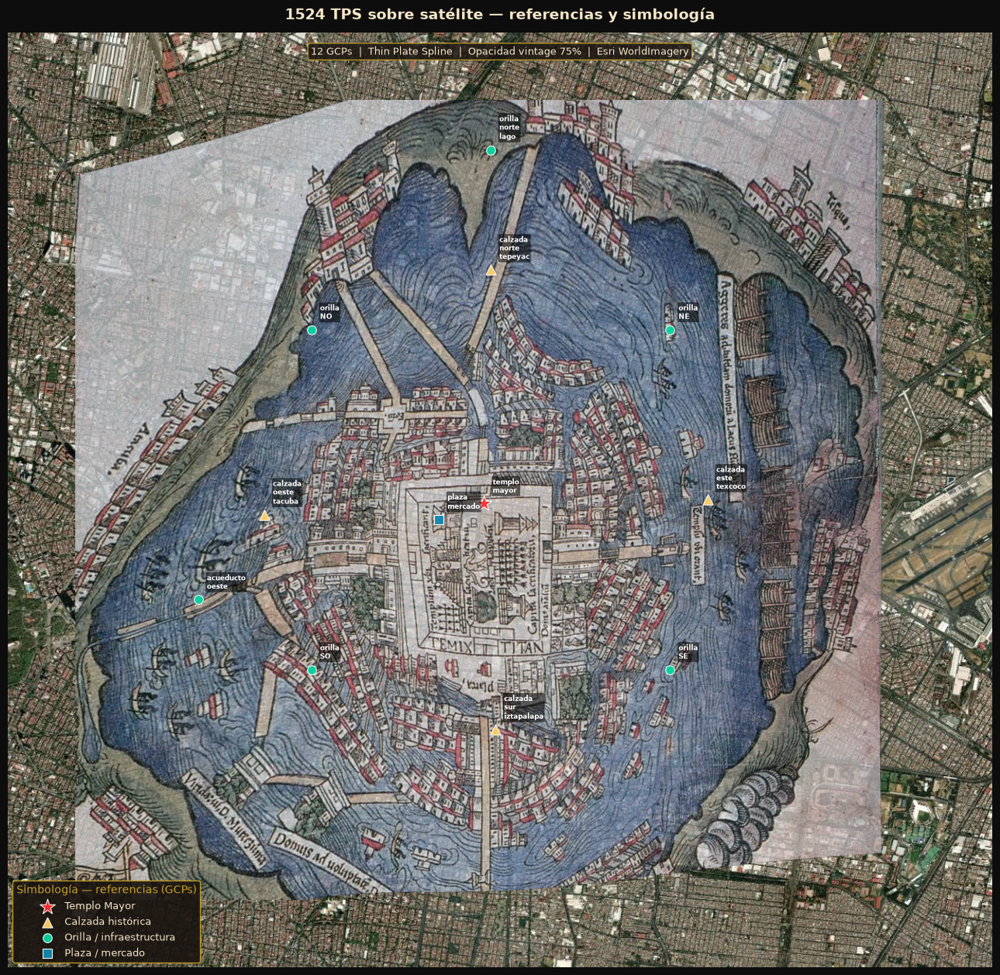

Guardado: Dia7_Vintage_Sobre_Moderno.png


In [6]:
# GeoDataFrame con TODOS los GCPs / referencias
gdf_refs = gpd.GeoDataFrame(
    gcps_df.copy(),
    geometry=gpd.points_from_xy(gcps_df['longitud'], gcps_df['latitud']),
    crs='EPSG:4326'
).to_crs(epsg=3857)

# Simbología por tipo de referencia
def categoria(nombre: str) -> str:
    n = nombre.lower()
    if 'templo' in n:
        return 'Templo Mayor'
    if 'calzada' in n:
        return 'Calzada histórica'
    if 'orilla' in n or 'acueducto' in n:
        return 'Orilla / infraestructura'
    if 'plaza' in n or 'mercado' in n:
        return 'Plaza / mercado'
    return 'Otro'

gdf_refs['categoria'] = gdf_refs['nombre'].map(categoria)

SIMBOLOGIA = {
    'Templo Mayor': dict(color='#FF2D2D', marker='*', markersize=220, zorder=6, label='Templo Mayor'),
    'Calzada histórica': dict(color='#FFD166', marker='^', markersize=90, zorder=5, label='Calzada histórica'),
    'Orilla / infraestructura': dict(color='#06D6A0', marker='o', markersize=70, zorder=5, label='Orilla / infraestructura'),
    'Plaza / mercado': dict(color='#118AB2', marker='s', markersize=80, zorder=5, label='Plaza / mercado'),
}

fig, ax = plt.subplots(figsize=(13, 13))
fig.patch.set_facecolor('#0d0d0d')

pad = 800
ax.set_xlim(extent[0] - pad, extent[1] + pad)
ax.set_ylim(extent[2] - pad, extent[3] + pad)

try:
    ctx.add_basemap(
        ax,
        source=ctx.providers.Esri.WorldImagery,
        zoom_adjust=1,
        attribution=False,
        zorder=1,
    )
except Exception as e:
    print(f'Satélite no disponible ({e})')

ax.imshow(
    rgba,
    extent=extent,
    origin='upper',
    alpha=ALPHA_VINTAGE,
    zorder=2,
    interpolation='bilinear',
)

# Plot por categoría (simbología)
for cat, style in SIMBOLOGIA.items():
    subset = gdf_refs[gdf_refs['categoria'] == cat]
    if subset.empty:
        continue
    subset.plot(
        ax=ax,
        color=style['color'],
        marker=style['marker'],
        markersize=style['markersize'],
        edgecolor='white',
        linewidth=0.8,
        zorder=style['zorder'],
        label=style['label'],
        alpha=0.95,
    )

# Etiquetas de cada referencia
for _, row in gdf_refs.iterrows():
    x, y = row.geometry.x, row.geometry.y
    ax.annotate(
        row['nombre'].replace('_', '\n'),
        xy=(x, y),
        xytext=(8, 8),
        textcoords='offset points',
        fontsize=6.5,
        color='white',
        fontweight='bold',
        ha='left',
        va='bottom',
        zorder=7,
        bbox=dict(boxstyle='round,pad=0.15', facecolor='#000000', alpha=0.55, edgecolor='none'),
    )

# Leyenda / simbología
leg = ax.legend(
    loc='lower left',
    frameon=True,
    facecolor='#1a1410',
    edgecolor='#C9A227',
    labelcolor='#F5E6C8',
    fontsize=9,
    title='Simbología — referencias (GCPs)',
    title_fontsize=10,
)
leg.get_title().set_color('#C9A227')
leg.get_frame().set_alpha(0.92)

ax.set_axis_off()
ax.set_title(
    '1524 TPS sobre satélite — referencias y simbología',
    fontsize=14, fontweight='bold', color='#F5E6C8', pad=12
)
ax.text(
    0.5, 0.985,
    f'{len(gdf_refs)} GCPs  |  Thin Plate Spline  |  Opacidad vintage 75%  |  Esri WorldImagery',
    transform=ax.transAxes, ha='center', va='top', fontsize=9, color='#F5E6C8',
    bbox=dict(boxstyle='round,pad=0.3', facecolor='#1a1410', alpha=0.85, edgecolor='#C9A227')
)

plt.tight_layout()
plt.savefig(CARPETA_SALIDA / 'Dia7_Vintage_Sobre_Moderno.png', dpi=180, facecolor=fig.get_facecolor(), bbox_inches='tight')
plt.show()
print('Guardado: Dia7_Vintage_Sobre_Moderno.png')


### 6. Antes vs Después

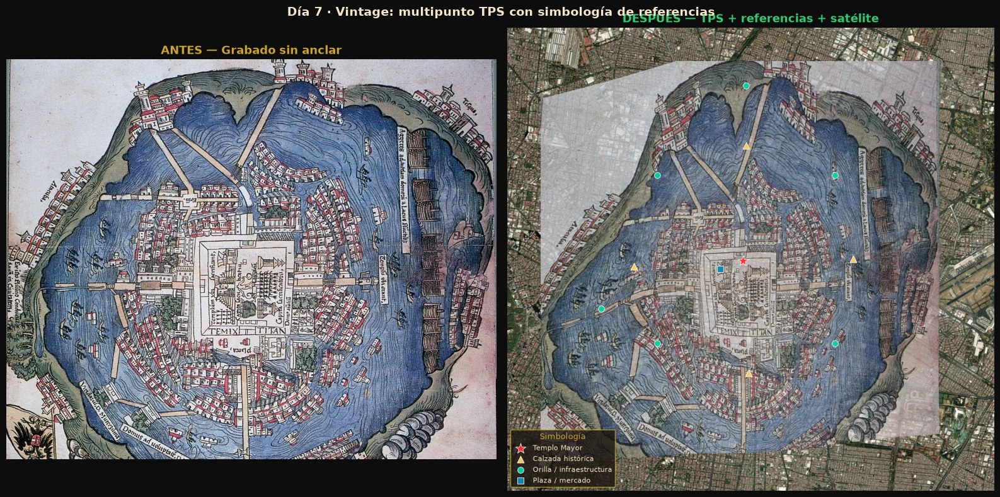

Guardado: Dia7_Antes_vs_Despues.png


In [7]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.patch.set_facecolor('#0d0d0d')

axes[0].imshow(img)
axes[0].set_title('ANTES — Grabado sin anclar', fontsize=13, fontweight='bold', color='#C9A227')
axes[0].set_axis_off()

ax1 = axes[1]
ax1.set_xlim(extent[0] - pad, extent[1] + pad)
ax1.set_ylim(extent[2] - pad, extent[3] + pad)
try:
    ctx.add_basemap(ax1, source=ctx.providers.Esri.WorldImagery, zoom_adjust=1, attribution=False, zorder=1)
except Exception:
    pass
ax1.imshow(rgba, extent=extent, origin='upper', alpha=ALPHA_VINTAGE, zorder=2, interpolation='bilinear')

for cat, style in SIMBOLOGIA.items():
    subset = gdf_refs[gdf_refs['categoria'] == cat]
    if subset.empty:
        continue
    subset.plot(
        ax=ax1,
        color=style['color'],
        marker=style['marker'],
        markersize=style['markersize'] * 0.7,
        edgecolor='white',
        linewidth=0.6,
        zorder=style['zorder'],
        label=style['label'],
        alpha=0.95,
    )

leg = ax1.legend(
    loc='lower left',
    frameon=True,
    facecolor='#1a1410',
    edgecolor='#C9A227',
    labelcolor='#F5E6C8',
    fontsize=8,
    title='Simbología',
    title_fontsize=9,
)
leg.get_title().set_color('#C9A227')

ax1.set_axis_off()
ax1.set_title('DESPUÉS — TPS + referencias + satélite', fontsize=13, fontweight='bold', color='#2ECC71')

fig.suptitle(
    'Día 7 · Vintage: multipunto TPS con simbología de referencias',
    fontsize=14, fontweight='bold', color='#F5E6C8', y=0.98
)
plt.tight_layout()
plt.savefig(CARPETA_SALIDA / 'Dia7_Antes_vs_Despues.png', dpi=180, facecolor=fig.get_facecolor(), bbox_inches='tight')
plt.show()
print('Guardado: Dia7_Antes_vs_Despues.png')


### 7. Insight
- **Affine** = mueve el papel entero (sigue viéndose "pegatina").
- **TPS multipunto** = estira el papel hasta clavar cada GCP; el grabado se distorsiona, pero **sí queda georreferenciado**.

Eso permite corroborar sobre satélite: el recinto sagrado cae sobre el Centro Histórico / Templo Mayor.

### Regenerar warp
```bash
python ../00_Datos/prepararMapaVintage.py
```

In [8]:
poi_csv = RUTA_DATOS / 'poi_templo_mayor.csv'
pd.DataFrame([{'nombre': 'Templo Mayor', 'longitud': lon_tm, 'latitud': lat_tm}]).to_csv(poi_csv, index=False)
print(f'POI: {poi_csv}')
print('Día 7 (TPS) completado.')

POI: ../00_Datos/poi_templo_mayor.csv
Día 7 (TPS) completado.
